In [1]:
import matplotlib.pyplot as plt
import numpy as np
from OSSWEM import SSWEM

mesh: ni = 80  nj = 80
Grid: dx = 7500.0 [m]  dy = 7500.0 [m]
cg = 28.284271247461902 [m s-1]
Ld = 282842.712474619 [m]
cg1 = 3.0618621784789726 [m s-1]
Ld1 = 30618.621784789724 [m]
Scales: Ls=epsilon/D/beta = None [m]
Scales: Lx/Ld = 2.121320343559643
Scales: Lx/Ld1 = 19.595917942265427
Res: Ld/dx = 37.71236166328253
Res: Ld1/dx = 4.0824829046386295


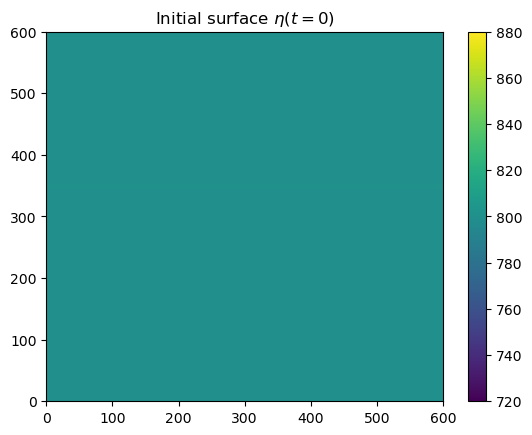

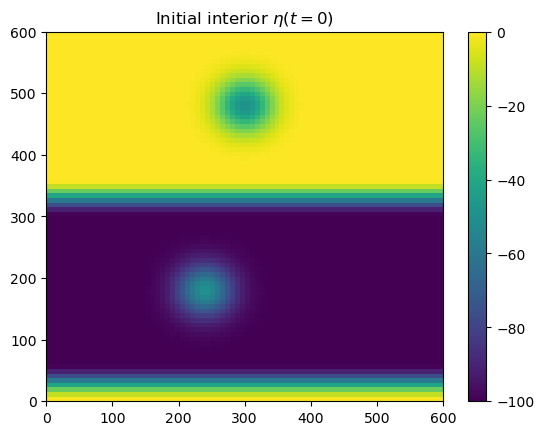

In [2]:
# Baroclinic instability in a channel problem
M = SSWEM(80,
          [1, 0.0625], # Gravity [m s-2]
          [200.,600.], # Layer thickness [m]
          600.e3, # Domain width [m]
          1.e-4, # Coriolis [s-1]
          0.e-11, # df/dy [m-1 s-1]
          5.e-4, # Bottom drag rate [m s-1]
          2e2, # Lateral viscosity [m2 s-1]
          nu_v=0.05, # Vertical viscosity [m2 s-1]
          h_zonal_relax=1e-5 # Forcing rate on zonal average eta [s-1]
          )
M.set_h_forcing(100., k=0)
M.set_h_forcing(-100., k=1)
M.h[0] = M.D + (M.h_zonal_target[0] - M.Ho[0])[:, None]
M.h[1] = M.D + (M.h_zonal_target[1] - M.Ho[1])[:, None]
M.perturb_h(50., 0.05 * M.Lx, 0.5 * M.Lx, 0.8 * M.Ly, k=0)
M.perturb_h(-50., 0.05 * M.Lx, 0.5 * M.Lx, 0.8 * M.Ly, k=1)
M.perturb_h(-50., 0.05 * M.Lx, 0.4 * M.Lx, 0.3 * M.Ly, k=0)
M.perturb_h(50., 0.05 * M.Lx, 0.4 * M.Lx, 0.3 * M.Ly, k=1)
plt.pcolormesh( M.xh1/1e3, M.yh1/1e3, M.eta(k=0) ); plt.colorbar(); plt.title(r'Initial surface $\eta(t=0)$');
plt.figure();
plt.pcolormesh( M.xh1/1e3, M.yh1/1e3, M.eta(k=1) ); plt.colorbar(); plt.title(r'Initial interior $\eta(t=0)$');

numba threads = 16
CFL: dt*f = 0.01
CFL: dt*cg/dx = 0.37712361663282534
CFL: dt*cg1/dx = 0.0408248290463863
CFL: dt*nu_h/dx^2 = 0.00035555555555555557
CFL*: dt*epsilon/h_bot = 8.333333333333334e-05
CFL*: dt*nu_v/h_min^2 = 0.000125
CFL*: dt*h_zonal_relax = 0.001
nsteps = 200000
Time: Trun * fo = 2000.0
Time: Trun * ( cg / L ) = 942.8090415820634
Running...
...done


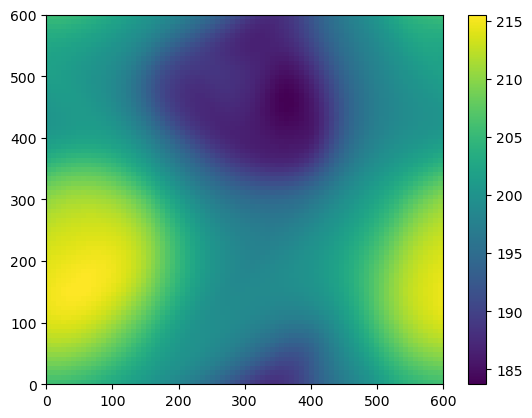

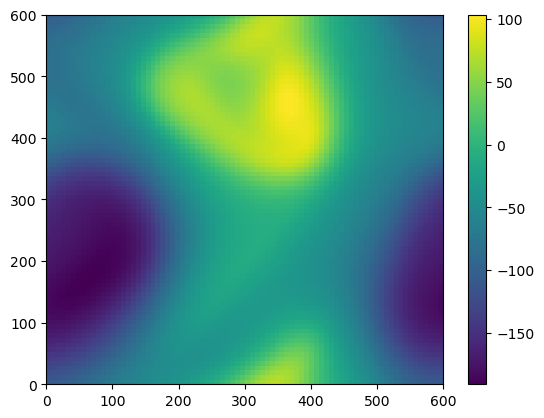

In [3]:
# Run the model
u,v,h,time = M.run(100., 1000, 200); # dt, steps/segment, segments
plt.pcolormesh( M.xh1/1e3, M.yh1/1e3, M.eta(k=0) ); plt.colorbar();
plt.figure();
plt.pcolormesh( M.xh1/1e3, M.yh1/1e3, M.eta(k=1) ); plt.colorbar();

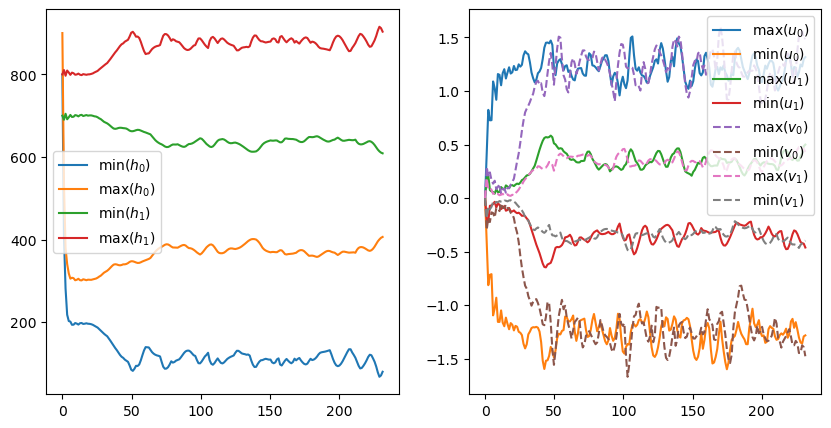

In [4]:
# Plot time series
fig,ax = plt.subplots(1,2,figsize=(10,5))
ax[0].plot( time/86400, h[:,0].min(axis=(1,2)), label=r'min($h_0$)' )
ax[0].plot( time/86400, h[:,0].max(axis=(1,2)), label=r'max($h_0$)' )
ax[0].plot( time/86400, h[:,1].min(axis=(1,2)), label=r'min($h_1$)' )
ax[0].plot( time/86400, h[:,1].max(axis=(1,2)), label=r'max($h_1$)' )
ax[0].legend();
ax[1].plot( time/86400, u[:,0].max(axis=(1,2)), label='max($u_0$)' )
ax[1].plot( time/86400, u[:,0].min(axis=(1,2)), label='min($u_0$)' )
ax[1].plot( time/86400, u[:,1].max(axis=(1,2)), label='max($u_1$)' )
ax[1].plot( time/86400, u[:,1].min(axis=(1,2)), label='min($u_1$)' )
ax[1].plot( time/86400, v[:,0].max(axis=(1,2)), '--', label='max($v_0$)' )
ax[1].plot( time/86400, v[:,0].min(axis=(1,2)), '--', label='min($v_0$)' )
ax[1].plot( time/86400, v[:,1].max(axis=(1,2)), '--', label='max($v_1$)' )
ax[1].plot( time/86400, v[:,1].min(axis=(1,2)), '--', label='min($v_1$)' )
ax[1].legend();

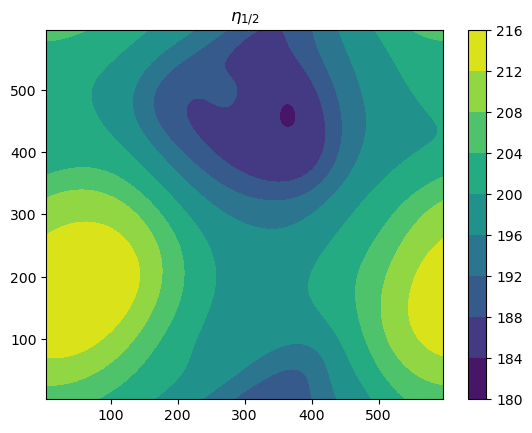

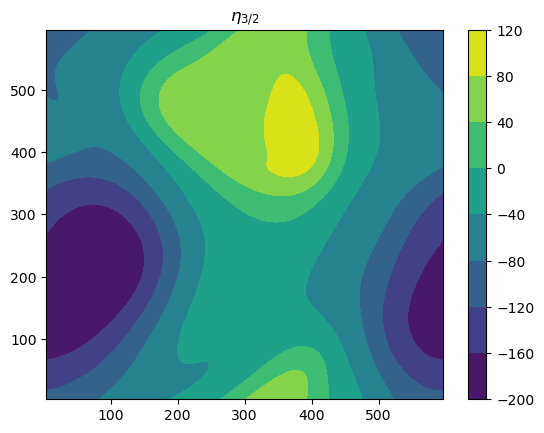

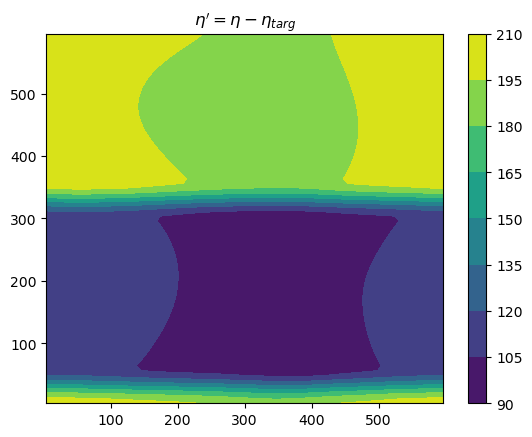

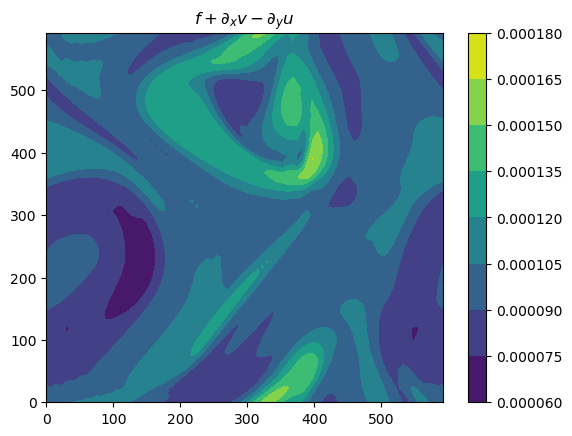

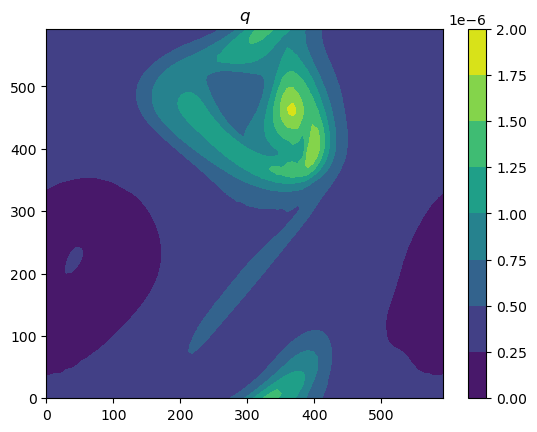

In [5]:
# Snapshot
plt.contourf( M.xh1/1e3, M.yh1/1e3, M.eta(k=0) ); plt.colorbar(); plt.title(r"$\eta_{1/2}$");
plt.figure();
plt.contourf( M.xh1/1e3, M.yh1/1e3, M.eta(k=1) ); plt.colorbar(); plt.title(r"$\eta_{3/2}$");
plt.figure();
plt.contourf( M.xh1/1e3, M.yh1/1e3, M.eta(k=0) - (M.h_zonal_target[0] - M.Ho[0])[:, None] ); plt.colorbar(); plt.title(r"$\eta' = \eta - \eta_{targ}$");
plt.figure();
plt.contourf( M.xq1/1e3, M.yq1/1e3, M.abs_omega(k=0) ); plt.colorbar(); plt.title(r'$f + \partial_x v - \partial_y u$');
plt.figure();
plt.contourf( M.xq1/1e3, M.yq1/1e3, M.q(h=h[-1], u=u[-1], v=v[-1], k=0) ); plt.colorbar(); plt.title(r'$q$');

In [6]:
# Animate
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots()
# Compute PV for all time levels
pv = np.array([M.q(h=h[n], u=u[n], v=v[n], k=0) for n in range(len(time))])
# Use consistent color limits across frames
vmin, vmax = pv.min(), pv.max()
cf = ax.contourf(M.xq1/1e3, M.yq1/1e3, pv[-1], levels=20, vmin=vmin, vmax=vmax)
cb = fig.colorbar(cf)
title = ax.set_title(f'$q$ at t = {time[0]/86400:.2f} days')

def update(n):
    ax.clear()
    ax.contourf(M.xq1/1e3, M.yq1/1e3, pv[n], levels=20, vmin=vmin, vmax=vmax)
    ax.set_title(f'$q$ at t = {time[n]/86400:.2f} days')

anim = FuncAnimation(fig, update, frames=len(time), interval=100)
plt.close(fig)
HTML(anim.to_jshtml())